# Business Case and Objective
Diabetic retinopathy is a potentially sight-threatening complication of diabetes mellitus. It occurs when high blood sugar levels associated with diabetes damage the blood vessels in the retina, the light-sensitive tissue at the back of the eye. The retina plays a crucial role in vision by capturing and transmitting visual information to the brain.

As diabetes progresses, the blood vessels in the retina may become weak, leaky, or blocked. This can lead to various abnormalities, including:

Non-proliferative diabetic retinopathy (NPDR): In the early stages, the blood vessels in the retina may leak fluid or develop tiny bulges called microaneurysms. These changes can cause mild to moderate vision problems.

Proliferative diabetic retinopathy (PDR): In advanced stages, the lack of oxygen and nutrients due to damaged blood vessels triggers the growth of abnormal new blood vessels. These new vessels are fragile and prone to bleeding, which can result in the formation of scar tissue. PDR can lead to severe vision loss or even blindness if not treated promptly.

Early detection and timely treatment of diabetic retinopathy are crucial to prevent vision loss. Regular eye examinations, including retinal imaging, are recommended for individuals with diabetes to monitor the health of their eyes and detect any signs of retinopathy.
 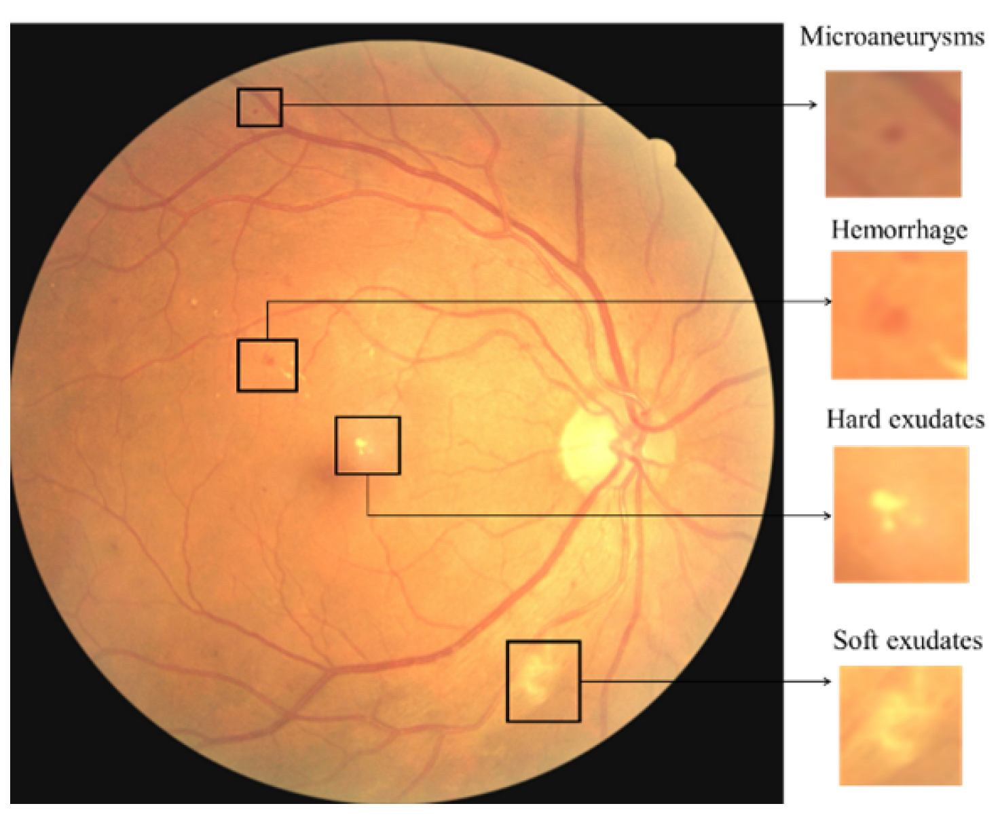


**Objective:**
The objective of the diabetic retinopathy dataset is to develop a robust and accurate classification model that can analyze retinal images and classify them into different stages or severity levels of diabetic retinopathy. The model should be able to provide reliable predictions for the presence and severity of the disease, thereby assisting healthcare professionals in making informed decisions regarding diagnosis, treatment, and referral of patients. The goal is to achieve high sensitivity and specificity in detecting diabetic retinopathy, reducing false negatives and false positives, and improving the overall diagnostic accuracy.

By achieving these objectives, the diabetic retinopathy dataset can contribute to the development of automated screening systems and decision support tools that can assist healthcare professionals in managing and treating diabetic retinopathy more effectively, ultimately improving patient care and outcomes.

## Importation of libraries

In [3]:
# mounting drive to have access to image folders
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd # data manipulation library
import matplotlib.pyplot as plt # graph and figure plotting library
import os # library Python module that provides a way to interact with the operating system; files and directories
from PIL import Image #Pillow library used to manipulate images like openCV
import numpy as np #library that performs numerical computations
import cv2 # library that helps in image manipulation like; reading ,writing, filtering and enhancement
from sklearn.model_selection import train_test_split # library helpss in splitting data into training and testing and also validation if necessary
from tensorflow.keras.utils import to_categorical # is used to convert integer labels into one-hot encoded vectors.
from tensorflow.keras.preprocessing.image import ImageDataGenerator #generating batches of augmented image data during model training to improve generalization
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
#MaxPool2D is a pooling layer for feature extraction(features with most importance)
#Dropout is used to prevent overfit and vomit some learnings
#Flatten is used as a bridge to move from  convolution layer to other layers
#Dense is a hidden layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import accuracy_score,confusion_matrix # metrics used for model evaluation
import seaborn as sns # plotting library similar to  matplotlib
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.vgg16 import VGG16 # Deep CNN library used for transfer learning
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from keras.utils import plot_model, load_img, img_to_array


## EDA( EXPLORATORY ANALYSIS)

### Loading the csv folder containing labels and image infromation

In [4]:

data = pd.read_csv('/content/drive/MyDrive/AI Client Project/Retina Extracted/data_all.csv')


### Display the first few rows of the dataset

In [5]:
print(data.head())

   Unnamed: 0                 file  cat
0           0    o_c1t10003118.jpg    1
1           1  o_c1t1003016260.jpg    1
2           2  o_c1t1004522299.jpg    1
3           3  o_c1t1008823172.jpg    1
4           4  o_c1t1011431188.jpg    1


# Comments:
- CSV  file has 3 columns containing categories,a file columnn which has the path for each image in the corresponding image folder and also an unnamed column that provides a count(index of each image)

### Check the distribution of the target variable


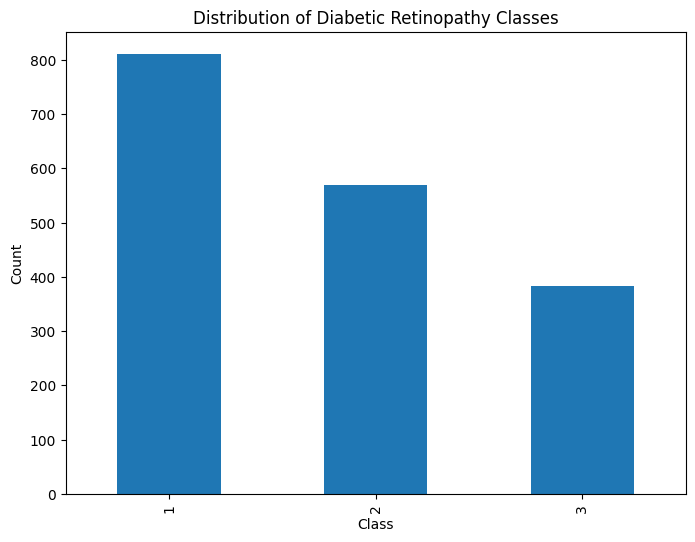

In [6]:
plt.figure(figsize=(8, 6))
data['cat'].value_counts().plot(kind='bar')
plt.title('Distribution of Diabetic Retinopathy Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

In [75]:
import plotly.graph_objects as go

# Compute value counts for each category
category_counts = data['cat'].value_counts()

# Create a pie chart
fig = go.Figure(data=[go.Pie(labels=category_counts.index, values=category_counts.values)])

# Customize the chart layout
fig.update_layout(
    title='Distribution of Diabetic Retinopathy Classes',
    template='plotly_dark',  # Set the sunset theme
)

fig.show()

# Comments:
- The images are devided into three categories notably 1,2,3 with varying densities and distributions. Category 1 shows the heighest distribution (46%), Category 2 (32.3%), and finally Category 3 the least with (21.8%)

In [30]:
import plotly.graph_objects as go

# Calculating the count of each class
class_counts = data['cat'].value_counts()

# Creating a bar plot using Plotly
fig = go.Figure(data=[go.Bar(x=class_counts.index, y=class_counts.values)])

# Customize the plot
fig.update_layout(
    title='Distribution of Diabetic Retinopathy Classes',
    xaxis_title='Class',
    yaxis_title='Count',
    plot_bgcolor='paleturquoise',  # Paleturquoise color for the plot background
    paper_bgcolor='paleturquoise',  # Paleturquoise color for the paper background
    font=dict(color='black')
)

# Defining a color palette for the bars
colors = ['#0000FF', '#000000', '#800080', '#00FFFF']  # Blue, black, purple, and cyan colors

# Creating a new trace with updated colors
new_trace = go.Bar(
    x=class_counts.index,
    y=class_counts.values,
    marker=dict(color=colors)
)

# Update the figure with the new trace
fig.update(data=[new_trace])

# Defining the animation frames
frames = [go.Frame(data=[go.Bar(x=class_counts.index, y=class_counts.values, marker=dict(color=colors))])]

# Defining the animation settings
animation_settings = dict(
    frame=dict(duration=500, redraw=True),
    fromcurrent=True,
    transition=dict(duration=300, easing='quadratic-in-out')
)

# Adding play and pause buttons for animation control
fig.update_layout(
    updatemenus=[
        dict(
            type='buttons',
            showactive=False,
            buttons=[
                dict(
                    label='Play',
                    method='animate',
                    args=[None, animation_settings]
                ),
                dict(
                    label='Pause',
                    method='animate',
                    args=[[None], animation_settings]
                )
            ],
        )
    ],
)

# Adding the animation frames to the figure
fig.frames = frames

# Showing the plot
fig.show()


### Getting the number of images in the entire dataset

In [9]:
num_images = len(data)
print("Number of Images:", num_images)

Number of Images: 1764


# Comment:
- There are 1764 inmages in the dataset


### Get unique classes and their counts

In [10]:
unique_classes = data['cat'].unique()
class_counts = data['cat'].value_counts()
print("Unique Classes:", unique_classes)
print("Class Counts:")
print(class_counts)

Unique Classes: [1 2 3]
Class Counts:
1    811
2    569
3    384
Name: cat, dtype: int64


## Working with the actual image folder

### Load the dataset

In [11]:
data = pd.read_csv('/content/drive/MyDrive/AI Client Project/Retina Extracted/data_all.csv')


### Visualize sample images from each class

In [20]:
#Using PLotly animated plotting

In [19]:
import plotly.subplots as sp
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from PIL import Image
from plotly.offline import iplot

# Defining the classes
classes = [1, 2, 3]

# Creating the subplot grid
fig = sp.make_subplots(
    rows=2, cols=3, subplot_titles=classes, horizontal_spacing=0.05, vertical_spacing=0.1
)

# Defining the maximum number of images to display per class
max_images_per_class = 5

# Iterating over the classes
for i, cls in enumerate(classes):
    # Getting the paths of sample images for the class
    sample_image_paths = data[data['cat'] == cls]['file'].iloc[:max_images_per_class]

    # Iterating over the sample images
    for j, sample_image_path in enumerate(sample_image_paths):
        sample_image_full_path = os.path.join(
            '/content/drive/MyDrive/AI Client Project/Retina Extracted/images', sample_image_path
        )

        # Resizing the image to reduce memory usage
        image = Image.open(sample_image_full_path)
        image = image.resize((200, 200))  # Adjust the size as per your preference

        # Adding the image subplot to the grid
        fig.add_trace(go.Image(z=image), row=i // 3 + 1, col=i % 3 + 1)

# Updating the layout
fig.update_layout(
    title='Sample Images for Each Class',
    plot_bgcolor='rgb(17, 17, 17)',  # Dark background color
    paper_bgcolor='rgb(17, 17, 17)',  # Dark background color
    font=dict(color='white'),  # White text color
    width=800,
    height=600,
    hovermode='closest',  # Enable hover interactions
    showlegend=False  # Hide legend
)

# Updating the subplots' axes properties
for i in range(1, 7):
    fig['layout'][f'xaxis{i}'].visible = False
    fig['layout'][f'yaxis{i}'].visible = False

# Defining the animation frames
frames = [go.Frame(data=fig['data'], layout=fig['layout'])]

# Add a play button and slider for animation control
fig.update_layout(
    updatemenus=[
        dict(
            type='buttons',
            showactive=False,
            buttons=[
                dict(
                    label='Play',
                    method='animate',
                    args=[
                        None,
                        {
                            'frame': {'duration': 500, 'redraw': True},
                            'fromcurrent': True,
                            'transition': {'duration': 300, 'easing': 'quadratic-in-out'}
                        }
                    ]
                )
            ],
        )
    ],
    sliders=[
        dict(
            active=0,
            steps=[
                dict(
                    method='animate',
                    args=[
                        None,
                        {
                            'frame': {'duration': 500, 'redraw': True},
                            'fromcurrent': True,
                            'transition': {'duration': 300, 'easing': 'quadratic-in-out'}
                        }
                    ],
                    label=''
                )
            ]
        )
    ]
)

# Display the plot in the notebook
fig.frames = frames
iplot(fig)

# Comment:
- Displaying  a images of each respective class

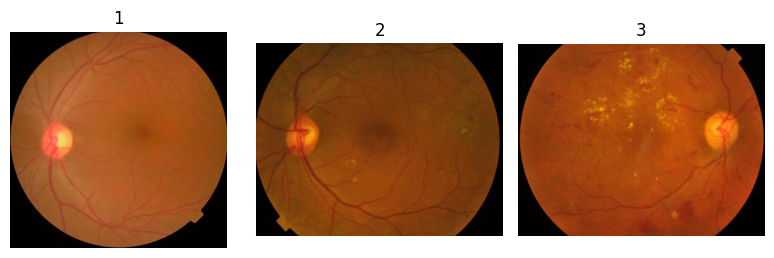

In [31]:
classes = [1, 2, 3]
plt.figure(figsize=(8, 5))
for i, cls in enumerate(classes):
    plt.subplot(2, 3, i + 1)
    sample_image_path = data[data['cat'] == cls]['file'].iloc[0]
    sample_image_full_path = os.path.join('/content/drive/MyDrive/AI Client Project/Retina Extracted/images', sample_image_path)
    image = plt.imread(sample_image_full_path)
    plt.imshow(image)
    plt.title(cls)
    plt.axis('off')
plt.tight_layout()
plt.show()

### Obtaining Image informations notably size,channels and the shapes

In [33]:
image_folder = '/content/drive/MyDrive/AI Client Project/Retina Extracted/images'  # Path to the folder containing the images
image_sizes = []
image_shapes = []
image_channels = []

for index, row in data.iterrows():
    image_path = os.path.join(image_folder, row['file'])
    image = Image.open(image_path)

    # Image size
    image_size = image.size
    image_sizes.append(image_size)

    # Image shape
    image_shape = image.size + (len(image.getbands()),)
    image_shapes.append(image_shape)

    # Image channels
    image_channels.append(len(image.getbands()))

# Print image information
print("Image Sizes:", image_sizes)
print("Image Shapes:", image_shapes)
print("Image Channels:", image_channels)

Image Sizes: [(899, 900), (899, 900), (843, 646), (899, 900), (834, 674), (898, 900), (898, 900), (899, 680), (608, 605), (605, 607), (605, 606), (899, 900), (606, 619), (899, 680), (899, 680), (605, 607), (897, 900), (899, 900), (899, 900), (611, 610), (899, 900), (898, 900), (898, 900), (606, 607), (899, 900), (899, 900), (899, 900), (899, 900), (899, 680), (898, 900), (607, 607), (608, 611), (840, 646), (607, 607), (899, 900), (899, 900), (899, 680), (899, 900), (899, 900), (898, 900), (898, 900), (899, 680), (606, 609), (834, 674), (899, 900), (605, 611), (898, 900), (609, 607), (605, 609), (899, 900), (899, 900), (899, 900), (899, 900), (898, 900), (898, 900), (899, 900), (899, 900), (899, 900), (899, 900), (609, 607), (898, 900), (899, 680), (834, 674), (606, 607), (898, 900), (834, 674), (834, 674), (898, 900), (857, 646), (899, 900), (899, 900), (898, 900), (897, 900), (606, 608), (604, 608), (898, 900), (899, 900), (899, 900), (609, 607), (899, 680), (604, 612), (899, 680), (8

Comment:
- From here we see that the images don't possess homogeneous shapes and sizes(variations in width and height) but one thing is common all are possess 3 channels (RGB). By implication before training we have to resize so that all can have homogeneous shapes and sizes.

### Image size distribution

In [35]:
import plotly.graph_objects as go

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/AI Client Project/Retina Extracted/data_all.csv')

# Collect image sizes
image_sizes = []
for path in data['file']:
    image_path = os.path.join('/content/drive/MyDrive/AI Client Project/Retina Extracted/images', path)
    image = plt.imread(image_path)
    height, width, _ = image.shape
    image_sizes.append((height, width))

# Extract heights and widths
heights = [size[0] for size in image_sizes]
widths = [size[1] for size in image_sizes]

# Create histogram traces
height_trace = go.Histogram(x=heights, nbinsx=50, opacity=0.5, name='Height')
width_trace = go.Histogram(x=widths, nbinsx=50, opacity=0.5, name='Width')

# Create layout
layout = go.Layout(
    title='Image Size Distribution',
    xaxis=dict(title='Size'),
    yaxis=dict(title='Frequency'),
    barmode='overlay',
    bargap=0.1,
    plot_bgcolor='rgb(255, 255, 255)',  # White plot background color
    paper_bgcolor='rgb(245, 245, 245)',  # Light gray paper background color
    font=dict(color='black')
)

# Create figure
fig = go.Figure(data=[height_trace, width_trace], layout=layout)

# Show plot
fig.show()

# Preprocessing

In [36]:
# Load the CSV file
data = pd.read_csv('/content/drive/MyDrive/AI Client Project/Retina Extracted/data_all.csv')

# Preprocess the images
image_folder = '/content/drive/MyDrive/AI Client Project/Retina Extracted/images'  # Replace 'image_folder' with the actual name of the image folder
image_size = (256, 256)  # Specifying a new size to homogenise all the image shapes


### Resize and normalize images

In [37]:
def preprocess_image(row):
    image_path = os.path.join(image_folder, row['file']) # appending each image in the image folder with its corresponding information from the csv folder.
    image = cv2.imread(image_path)
    if image is None:
        print("Failed to read image:", image_path)
        return None
    image = cv2.resize(image, image_size) # resizing all images in the image folder with new image size
    image = image.astype(np.float32) / 255.0 # normalising images to standardise input data accross different images
    return image

data['image'] = data.apply(preprocess_image, axis=1)  #applying all the above preprocessing steps to the individual images


### Remove rows with missing images

In [38]:
data = data.dropna(subset=['image'])

### Convert labels to categorical

In [39]:
data['cat'] = data['cat'].astype(str)
categories = data['cat'].unique()
num_classes = len(categories)
category_mapping = {category: index for index, category in enumerate(categories)}
data['label'] = data['cat'].map(category_mapping)
data['label'] = to_categorical(data['label'], num_classes=num_classes)


### Split the data into training and testing sets

In [40]:
X_train, X_test, y_train, y_test = train_test_split(data['image'], data['label'], test_size=0.2, random_state=42)
# splitting data in a ratio of 80:20 for training and testing

### Convert images and labels to numpy arrays

In [41]:
# converting to arrays because machine learning frameworks, such as TensorFlow or PyTorch, are designed to work with numerical data
X_train = np.array(X_train.tolist())
X_test = np.array(X_test.tolist())
y_train = np.array(y_train.tolist())
y_test = np.array(y_test.tolist())


### Print the shapes of the training and testing data

In [42]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (1411, 256, 256, 3)
y_train shape: (1411,)
X_test shape: (353, 256, 256, 3)
y_test shape: (353,)


### Convert labels to categorical

In [43]:
# Categorical encoding represents labels as one-hot vectors, which can be beneficial for model compatibilty

Compatibility with Model Inputs
y_train = to_categorical(y_train, num_classes=num_classes)
y_test = to_categorical(y_test, num_classes=num_classes)

In [44]:
print('y_train.shape:', y_train.shape)
print('y_test.shape:', y_test.shape)

y_train.shape: (1411, 3)
y_test.shape: (353, 3)


### Data Augmentation

In [45]:
# Create an ImageDataGenerator instance
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

### Define batch size and image input shape

In [46]:
batch_size = 32 #batch size The batch size is a hyperparameter that determines the number of samples processed by the model in each training iteration.
input_shape = (256, 256, 3)  # Assuming RGB images

### Create a training data generator

In [47]:
train_generator = datagen.flow(X_train, y_train, batch_size=batch_size)


### Create a validation data generator

In [48]:
validation_generator = datagen.flow(X_test, y_test, batch_size=batch_size)


### Print the number of training and validation steps

In [49]:
train_steps = len(X_train) // batch_size
val_steps = len(X_test) // batch_size
print("Number of training steps:", train_steps)
print("Number of validation steps:", val_steps)

Number of training steps: 44
Number of validation steps: 11


# Model building

## Definining the Model Architechture

In [50]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape)) # input layer
model.add(MaxPooling2D((2, 2))) # Feature extraction layer
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten()) # The Flatten layer in a neural network is used to reshape the input tensor into a one-dimensional vector reducing the number of parameters and enabling
#compatibility with dense layers.
model.add(Dense(256, activation='relu')) #This is the fully connected (1 hidden layer)
model.add(Dropout(0.5)) # Dropout is a regularization technique commonly used in deep learning to prevent overfitting
#so the model learns from 50% of the data only

model.add(Dense(3, activation='softmax')) #This is the output layer with output with activation function
#softmax for multiclass classification

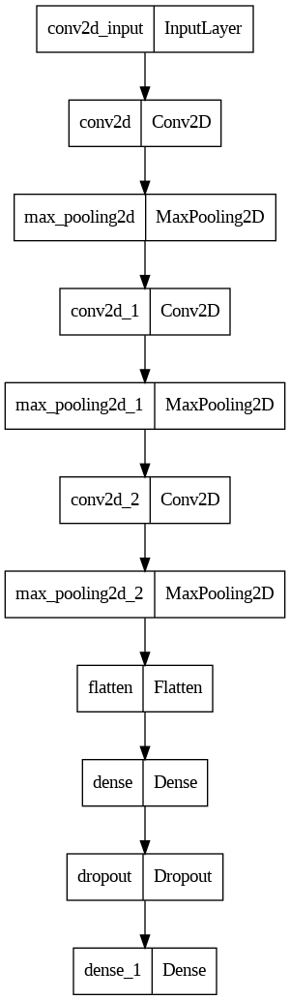

In [53]:
plot_model(model)

### Compile the model

In [54]:
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

### Define model checkpoints and early stopping

In [55]:
#Early stopping reduces time complexity and increases efficiency
# checkpointing helps save weights in training
checkpoint = ModelCheckpoint('model_weights.h5', save_best_only=True, save_weights_only=True, monitor='val_accuracy', mode='max', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1)


### Model training

In [56]:
history = model.fit(train_generator,
                    steps_per_epoch=train_steps,
                    epochs=25,
                    validation_data=validation_generator,
                    validation_steps=val_steps,
                    callbacks=[checkpoint, early_stopping])


Epoch 1/25
44/44 [==============================] - ETA: 0s - loss: 0.6209 - accuracy: 0.6722
Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to model_weights.h5
44/44 [==============================] - 42s 670ms/step - loss: 0.6209 - accuracy: 0.6722 - val_loss: 0.5131 - val_accuracy: 0.7727
Epoch 2/25
44/44 [==============================] - ETA: 0s - loss: 0.4788 - accuracy: 0.8071
Epoch 2: val_accuracy improved from 0.77273 to 0.80682, saving model to model_weights.h5
44/44 [==============================] - 28s 639ms/step - loss: 0.4788 - accuracy: 0.8071 - val_loss: 0.3999 - val_accuracy: 0.8068
Epoch 3/25
44/44 [==============================] - ETA: 0s - loss: 0.3971 - accuracy: 0.8303
Epoch 3: val_accuracy improved from 0.80682 to 0.83523, saving model to model_weights.h5
44/44 [==============================] - 32s 700ms/step - loss: 0.3971 - accuracy: 0.8303 - val_loss: 0.3514 - val_accuracy: 0.8352
Epoch 4/25
44/44 [==============================] - ETA: 0

### Evaluate the model on the test set

In [57]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)

12/12 [==============================] - 1s 47ms/step - loss: 0.2191 - accuracy: 0.9150
Test Loss: 0.21912120282649994
Test Accuracy: 0.9150141477584839


### Plotting Model Performance (training, validation Loss and Accuracy)

In [58]:
#Plotly version of the code
import plotly.graph_objects as go

# Plotting validation loss
loss_trace = go.Scatter(
    x=list(range(len(history.history['val_loss']))),
    y=history.history['val_loss'],
    mode='lines',
    name='Validation Loss'
)

loss_layout = go.Layout(
    title='Validation Loss',
    xaxis=dict(title='Epochs'),
    yaxis=dict(title='Loss')
)

loss_fig = go.Figure(data=[loss_trace], layout=loss_layout)
loss_fig.show()

# Plotting validation accuracy
accuracy_trace = go.Scatter(
    x=list(range(len(history.history['val_accuracy']))),
    y=history.history['val_accuracy'],
    mode='lines',
    name='Validation Accuracy'
)

accuracy_layout = go.Layout(
    title='Validation Accuracy',
    xaxis=dict(title='Epochs'),
    yaxis=dict(title='Accuracy')
)

accuracy_fig = go.Figure(data=[accuracy_trace], layout=accuracy_layout)
accuracy_fig.show()

### Making Predictions on test Set

In [59]:
y_pred = model.predict(X_test)

# Convert predictions to binary values (0 or 1) based on a threshold
threshold = 0.5
y_pred_binary = np.where(y_pred > threshold, 1, 0)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred_binary)
print("Accuracy:", accuracy)


12/12 [==============================] - 0s 26ms/step
Accuracy: 0.9150141643059491


### Inferencing and checking correct classification on some sample images in test set

1/1 [==============================] - 0s 252ms/step


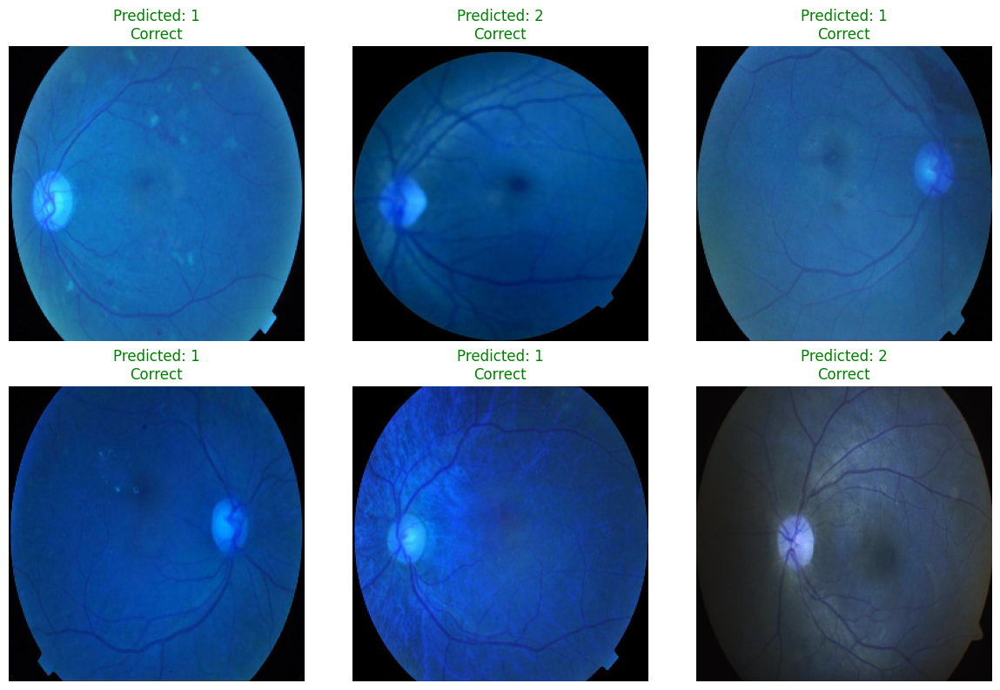

In [60]:
# Load the trained model
model.load_weights('model_weights.h5')

# Define class labels
class_labels = [1,2,3]

# Function to make predictions and annotate images
def predict_and_annotate(images, labels):
    predictions = model.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)

    plt.figure(figsize=(12, 8))
    for i in range(len(images)):
        plt.subplot(2, 3, i+1)
        plt.imshow(images[i])

        # Set the correct or incorrect annotation
        if predicted_labels[i] == np.argmax(labels[i]):
            color = 'green'
            annotation = 'Correct'
        else:
            color = 'red'
            annotation = 'Incorrect'

        plt.title(f'Predicted: {class_labels[predicted_labels[i]]}\n{annotation}', color=color)
        plt.axis('off')
    plt.tight_layout()
    plt.show()
# Select sample images from the test set
sample_images = X_test[:6]
sample_labels = y_test[:6]

# Make predictions and annotate the sample images
predict_and_annotate(sample_images, sample_labels)

# Comments:
- Out of the six images our model predicted accurately the labels indicating a beautiful performance

# Using Transfer Learning method also

### Load the CSV file

In [4]:
data = pd.read_csv('/content/drive/MyDrive/AI Client Project/Retina Extracted/data_all.csv')  # Replace with the actual path to your CSV file

# Define the image folder and image size
image_folder = '/content/drive/MyDrive/AI Client Project/Retina Extracted/images'  # Replace with the actual path to your image folder
image_size = (224, 224)  # Specify the input image size for VGG16

### Preprocess the images

In [5]:
def preprocess_image(row):
    image_path = os.path.join(image_folder, row['file'])
    image = cv2.imread(image_path)
    image = cv2.resize(image, image_size)
    image = image.astype(np.float32) / 255.0
    return image

data['image'] = data.apply(preprocess_image, axis=1)


### Convert labels to categorical

In [6]:
num_classes = len(data['cat'].unique())
data['label'] = pd.Categorical(data['cat']).codes

### Split the data into training and testing sets

In [7]:
X_train, X_test, y_train, y_test = train_test_split(data['image'], data['label'], test_size=0.2, random_state=42)


### Create data generators for data augmentation

In [8]:
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)


### Create the VGG16 model

In [9]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))


58889256/58889256 [==============================] - 1s 0us/step


### Compile the model

In [10]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

### Set up model checkpoint

In [11]:
checkpoint = ModelCheckpoint('vgg16_model.h5', monitor='val_loss', save_best_only=True)

### Train the model

In [12]:
train_generator = train_datagen.flow(np.array(X_train.tolist()), y_train, batch_size=32)
test_generator = test_datagen.flow(np.array(X_test.tolist()), y_test, batch_size=32)


In [13]:
history = model.fit(train_generator, epochs=20, validation_data=test_generator, callbacks=[checkpoint])


Epoch 1/20
45/45 [==============================] - ETA: 0s - loss: 1.1124 - accuracy: 0.4274

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


45/45 [==============================] - 55s 619ms/step - loss: 1.1124 - accuracy: 0.4274 - val_loss: 1.0614 - val_accuracy: 0.4589
Epoch 2/20
45/45 [==============================] - 26s 584ms/step - loss: 1.0729 - accuracy: 0.4437 - val_loss: 1.0634 - val_accuracy: 0.4589
Epoch 3/20
45/45 [==============================] - 26s 574ms/step - loss: 1.0663 - accuracy: 0.4500 - val_loss: 1.0616 - val_accuracy: 0.4589
Epoch 4/20
45/45 [==============================] - 26s 570ms/step - loss: 1.0634 - accuracy: 0.4578 - val_loss: 1.0647 - val_accuracy: 0.4589
Epoch 5/20
45/45 [==============================] - 27s 595ms/step - loss: 1.0662 - accuracy: 0.4458 - val_loss: 1.0603 - val_accuracy: 0.4589
Epoch 6/20
45/45 [==============================] - 26s 567ms/step - loss: 1.0623 - accuracy: 0.4408 - val_loss: 1.0618 - val_accuracy: 0.4589
Epoch 7/20
45/45 [==============================] - 28s 614ms/step - loss: 1.0582 - accuracy: 0.4536 - val_loss: 1.0636 - val_accuracy: 0.4589
Epoch 8/20

### Evaluate the model

In [14]:
loss, accuracy = model.evaluate(test_generator)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

12/12 [==============================] - 1s 111ms/step - loss: 1.0634 - accuracy: 0.4589
Test Loss: 1.0634394884109497
Test Accuracy: 0.4589235186576843


##**Conclusion**:
- The dataset wasnt really complicated, with a small sample, exploratory data analysis and training went smoothly with good training and testing accuracy.
- Model accurately predicted the labels of a sample of 6 random images.
- However i tried using transfer learning with VGG16 as a compliments to see how the performance will look like, it however performed poorer than the sequential model due to small datasize relative to the complex vgg16 architecture with is created to handle bigger data .
-I also used plotly for plotting with advantage of more esthetic presentations complimented with annotated details

  **Thank You for your patience going thus far!!**